### Imports

In [1]:
import numpy as np
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook as tqdm
import statistics

### Creating pandas dataframe

In [2]:
foldernames = os.listdir('../data/images/keggle_data_animals/raw-img')
category_names = []
categories = []
files = []
i = 0
for k, folder in enumerate(foldernames):
    filenames = os.listdir("../data/images/keggle_data_animals/raw-img/" + folder);
    for file in filenames:
        files.append("../data/images/keggle_data_animals/raw-img/" + folder + "/" + file)
        categories.append(k)
        category_names.append(folder)
        
df = pd.DataFrame({
    'filename': files,
    'category': categories,
    'category_names': category_names
})
train_df = pd.DataFrame(columns=['filename', 'category'])
for i in range(10):
    train_df = train_df.append(df[df.category == i])

train_df.head()
train_df = train_df.reset_index(drop=True)
train_df

,filename,category,category_names
0,../data/images/keggle_data_animals/raw-img/but...,0,butterfly
1,../data/images/keggle_data_animals/raw-img/but...,0,butterfly
2,../data/images/keggle_data_animals/raw-img/but...,0,butterfly
3,../data/images/keggle_data_animals/raw-img/but...,0,butterfly
4,../data/images/keggle_data_animals/raw-img/but...,0,butterfly
...,...,...,...
26174,../data/images/keggle_data_animals/raw-img/squ...,9,squirrel
26175,../data/images/keggle_data_animals/raw-img/squ...,9,squirrel
26176,../data/images/keggle_data_animals/raw-img/squ...,9,squirrel
26177,../data/images/keggle_data_animals/raw-img/squ...,9,squirrel


### Data exploring

In [3]:
train_df['category'].describe()


count     26179
unique       10
top           4
freq       4863
Name: category, dtype: int64

In [4]:
train_df['category'].value_counts()

4    4863
8    4821
2    3098
6    2623
0    2112
3    1866
9    1862
7    1820
1    1668
5    1446
Name: category, dtype: int64

In [5]:
train_df['category_names'].value_counts()

dog          4863
spider       4821
chicken      3098
horse        2623
butterfly    2112
cow          1866
squirrel     1862
sheep        1820
cat          1668
elephant     1446
Name: category_names, dtype: int64

In [6]:
# First 200 image sizes
for i in range(200):
    img = cv2.imread(train_df['filename'][i])
    print(img.shape)
    

(640, 426, 3)
(457, 640, 3)
(640, 426, 3)
(640, 425, 3)
(640, 426, 3)
(454, 640, 3)
(426, 640, 3)
(439, 640, 3)
(416, 640, 3)
(375, 640, 3)
(386, 640, 3)
(426, 640, 3)
(426, 640, 3)
(480, 640, 3)
(546, 640, 3)
(425, 640, 3)
(480, 640, 3)
(426, 640, 3)
(426, 640, 3)
(480, 640, 3)
(440, 640, 3)
(426, 640, 3)
(640, 640, 3)
(511, 640, 3)
(480, 640, 3)
(426, 640, 3)
(426, 640, 3)
(425, 640, 3)
(421, 640, 3)
(640, 426, 3)
(426, 640, 3)
(426, 640, 3)
(426, 640, 3)
(427, 640, 3)
(480, 640, 3)
(426, 640, 3)
(426, 640, 3)
(369, 640, 3)
(481, 640, 3)
(426, 640, 3)
(425, 640, 3)
(378, 640, 3)
(546, 640, 3)
(426, 640, 3)
(424, 640, 3)
(447, 640, 3)
(480, 640, 3)
(425, 640, 3)
(480, 640, 3)
(640, 615, 3)
(426, 640, 3)
(480, 640, 3)
(480, 640, 3)
(533, 640, 3)
(451, 640, 3)
(640, 424, 3)
(395, 640, 3)
(426, 640, 3)
(460, 640, 3)
(423, 640, 3)
(423, 640, 3)
(426, 640, 3)
(480, 640, 3)
(512, 640, 3)
(512, 640, 3)
(425, 640, 3)
(420, 640, 3)
(426, 640, 3)
(426, 640, 3)
(427, 640, 3)
(426, 640, 3)
(381, 

In [7]:
# Finding Average shape of the data

shape_0 = []
shape_1 = []
for i in range(train_df['filename'].count()):
    img = cv2.imread(train_df['filename'][i])
    shape_0.append(img.shape[0])
    shape_1.append(img.shape[1])
average_shape_0 = statistics.mean(shape_0)
average_shape_1 = statistics.mean(shape_1)
print(average_shape_0)
print(average_shape_1)

252.63016157989227
320.0388097329921


### Image resizing and Data visualization

In [9]:
dim = (320, 252)
images = []
with tqdm(total=len(train_df)) as pbar:
    for i, file_path in enumerate(train_df.filename.values):
        #read image
        img = cv2.imread(file_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
        images.append(resized)
        pbar.update(1)

images = np.array(images)

C:\Users\edgar\anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  import sys


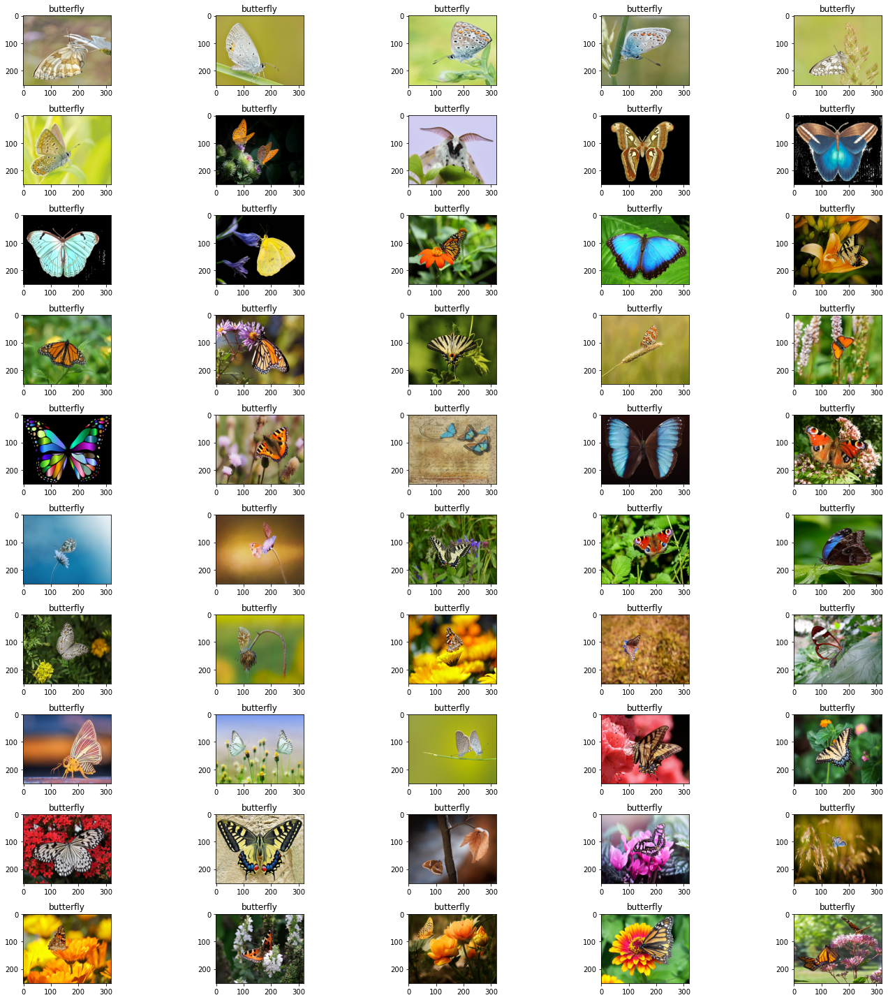

In [15]:
rows,cols = 10,5
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20,20))
for i in range(50):
    path = train_df[train_df.category == 0].values[i]
    axes[i//cols, i%cols].set_title(path[0].split('/')[-2])
    axes[i//cols, i%cols].imshow(images[train_df[train_df.filename == path[0]].index[0]])
plt.tight_layout()

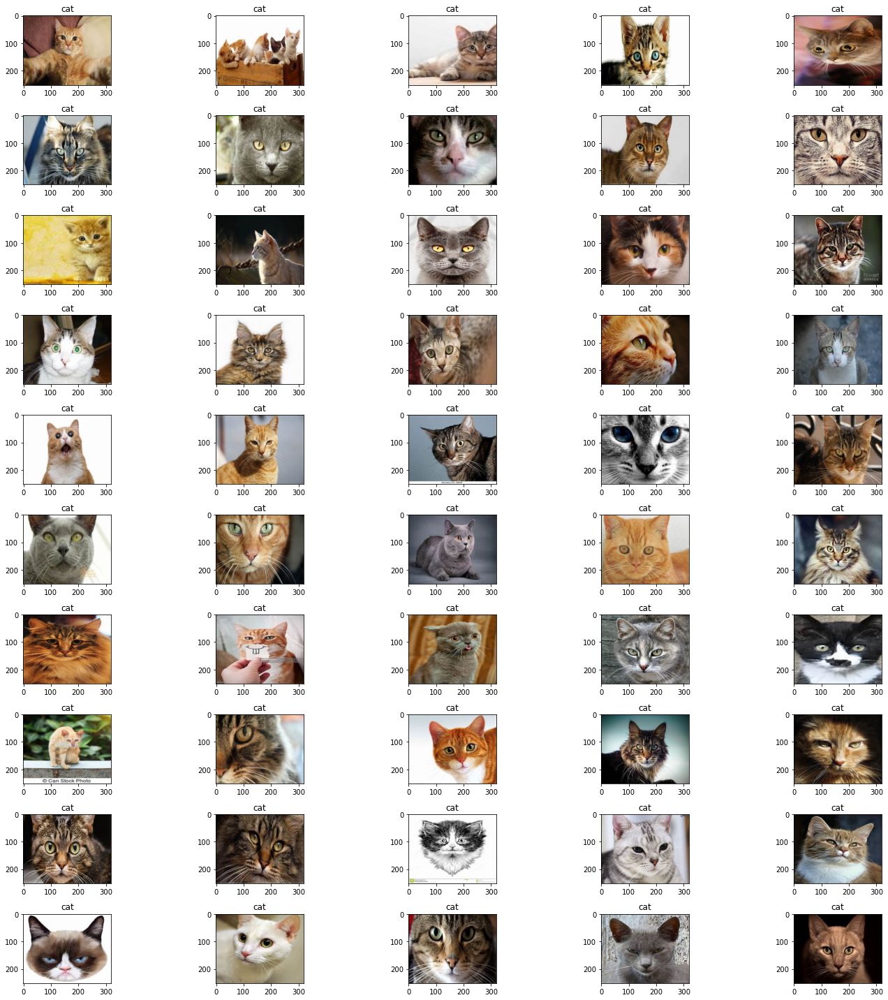

In [16]:
rows,cols = 10,5
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20,20))
for i in range(50):
    path = train_df[train_df.category == 1].values[i]
    axes[i//cols, i%cols].set_title(path[0].split('/')[-2])
    axes[i//cols, i%cols].imshow(images[train_df[train_df.filename == path[0]].index[0]])
plt.tight_layout()

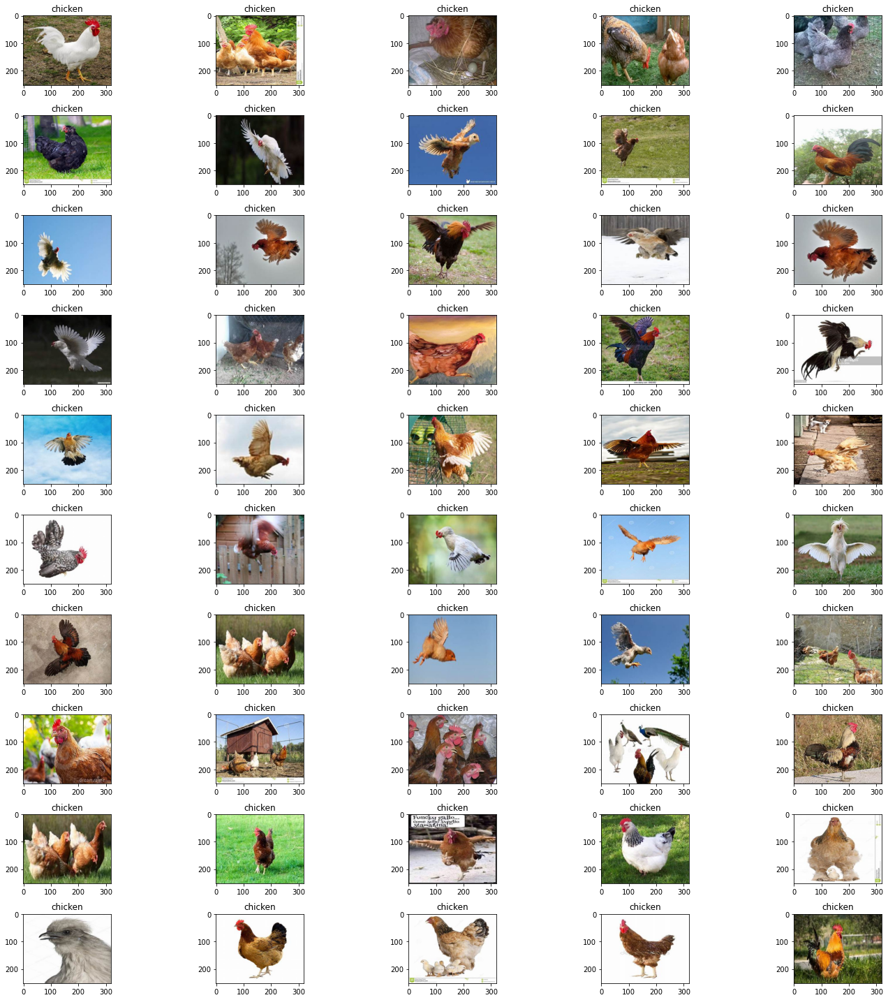

In [17]:
rows,cols = 10,5
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20,20))
for i in range(50):
    path = train_df[train_df.category == 2].values[i]
    axes[i//cols, i%cols].set_title(path[0].split('/')[-2])
    axes[i//cols, i%cols].imshow(images[train_df[train_df.filename == path[0]].index[0]])
plt.tight_layout()

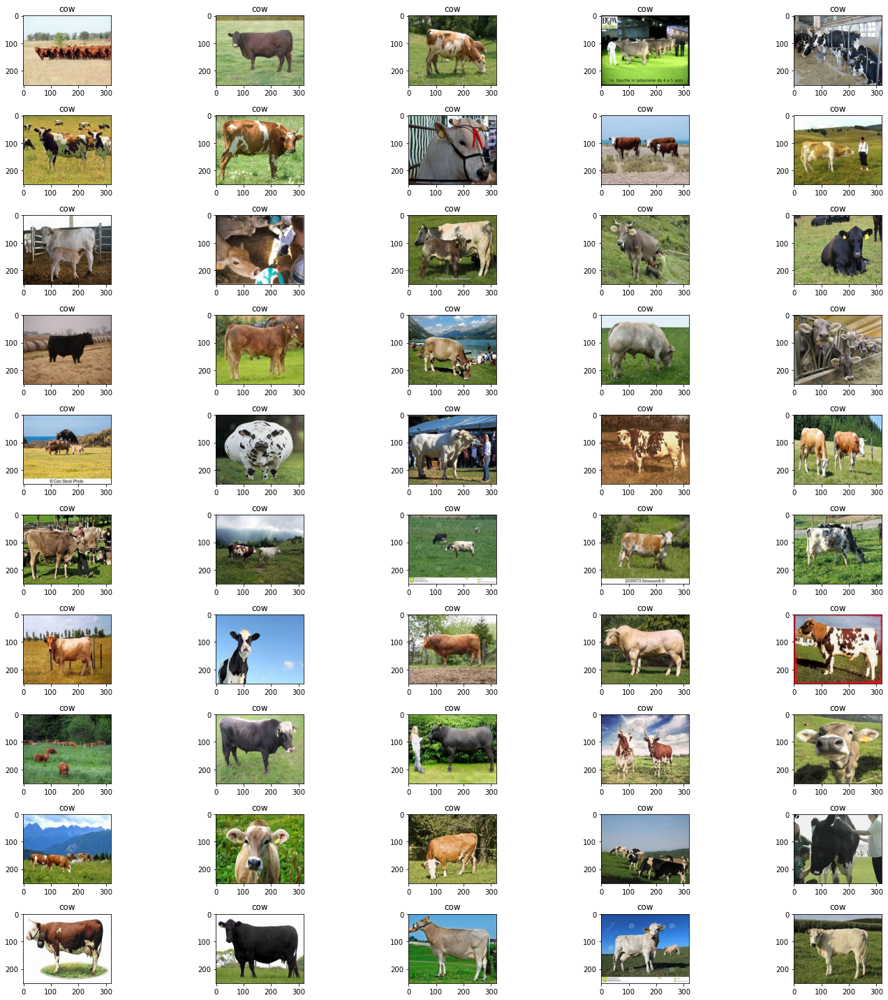

In [18]:
rows,cols = 10,5
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20,20))
for i in range(50):
    path = train_df[train_df.category == 3].values[i]
    axes[i//cols, i%cols].set_title(path[0].split('/')[-2])
    axes[i//cols, i%cols].imshow(images[train_df[train_df.filename == path[0]].index[0]])
plt.tight_layout()

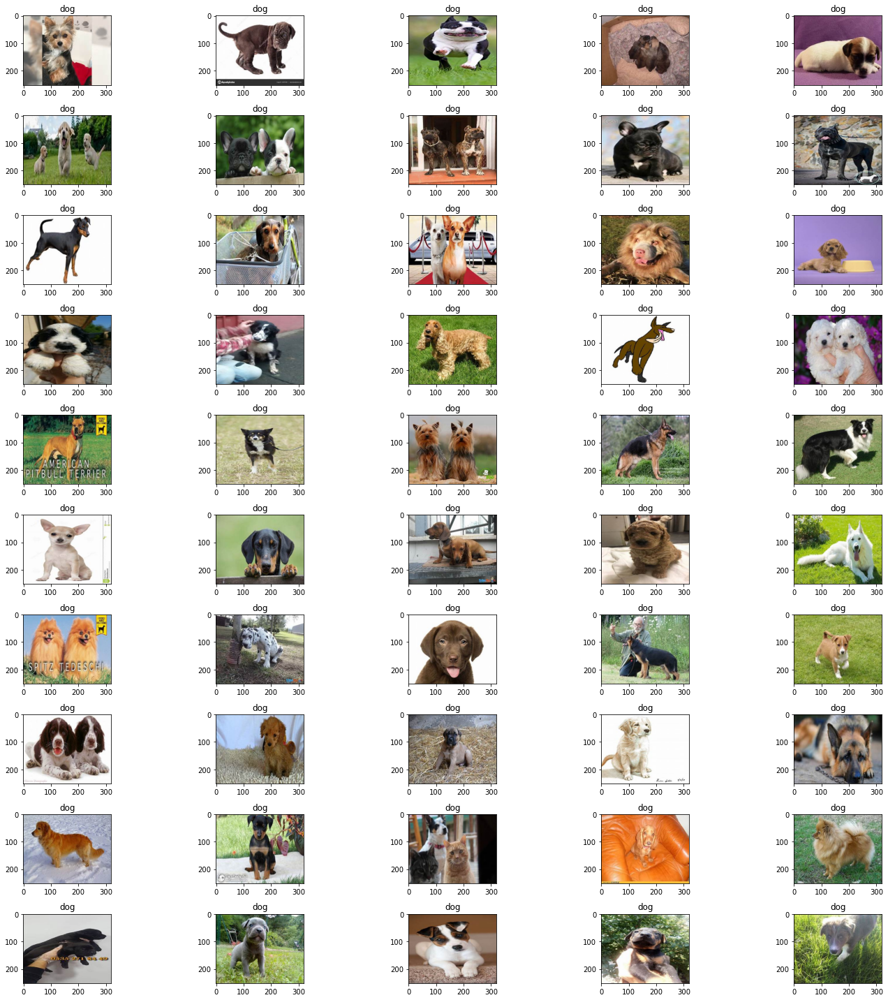

In [19]:
rows,cols = 10,5
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20,20))
for i in range(50):
    path = train_df[train_df.category == 4].values[i]
    axes[i//cols, i%cols].set_title(path[0].split('/')[-2])
    axes[i//cols, i%cols].imshow(images[train_df[train_df.filename == path[0]].index[0]])
plt.tight_layout()

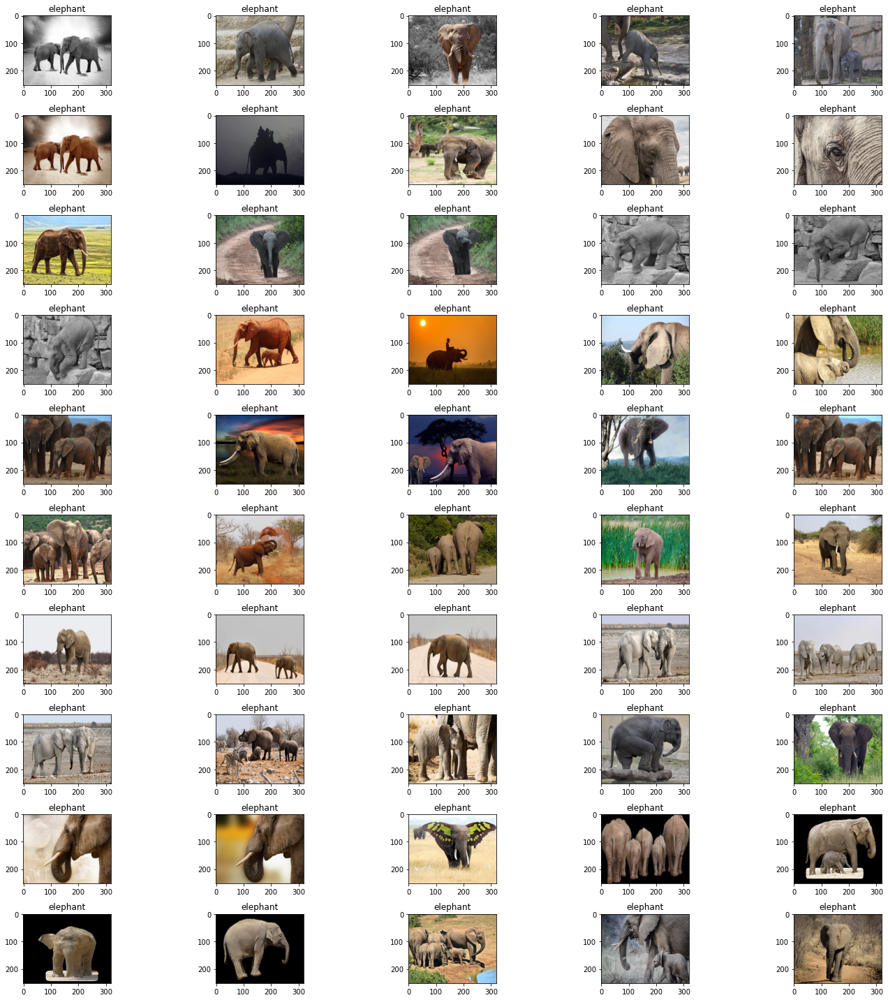

In [20]:
rows,cols = 10,5
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20,20))
for i in range(50):
    path = train_df[train_df.category == 5].values[i]
    axes[i//cols, i%cols].set_title(path[0].split('/')[-2])
    axes[i//cols, i%cols].imshow(images[train_df[train_df.filename == path[0]].index[0]])
plt.tight_layout()

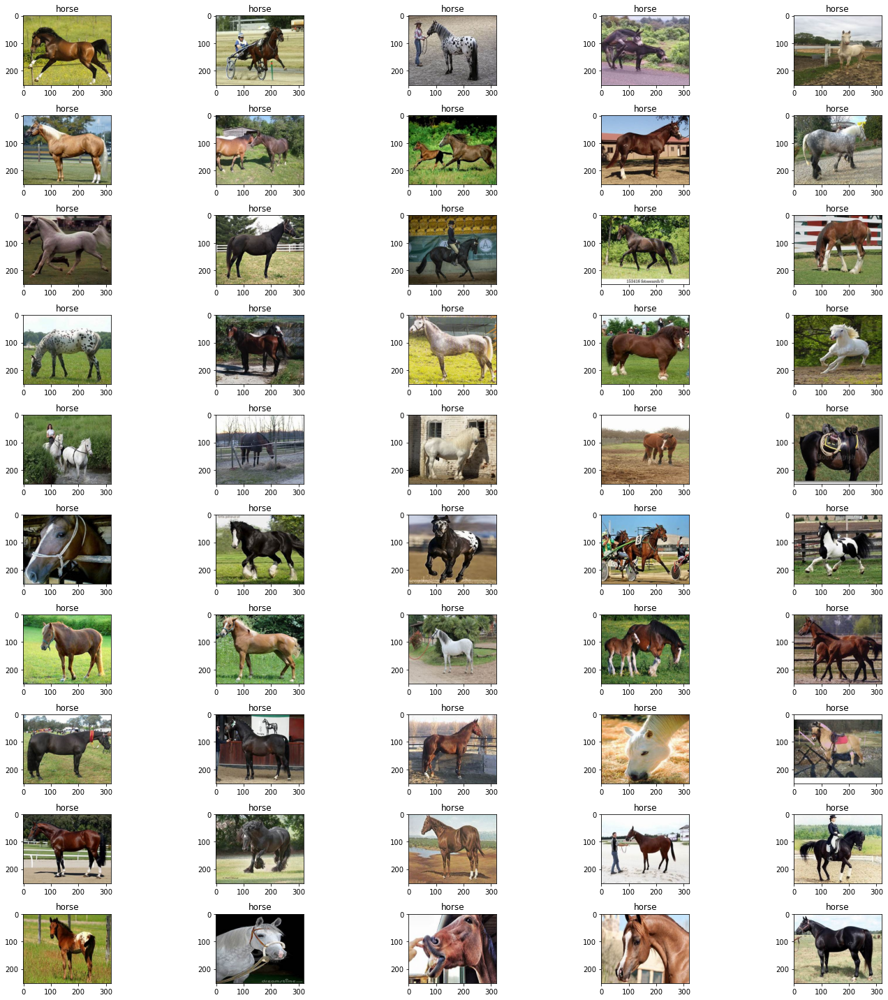

In [24]:
rows,cols = 10,5
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20,20))
for i in range(50):
    path = train_df[train_df.category == 6].values[i]
    axes[i//cols, i%cols].set_title(path[0].split('/')[-2])
    axes[i//cols, i%cols].imshow(images[train_df[train_df.filename == path[0]].index[0]])
plt.tight_layout()

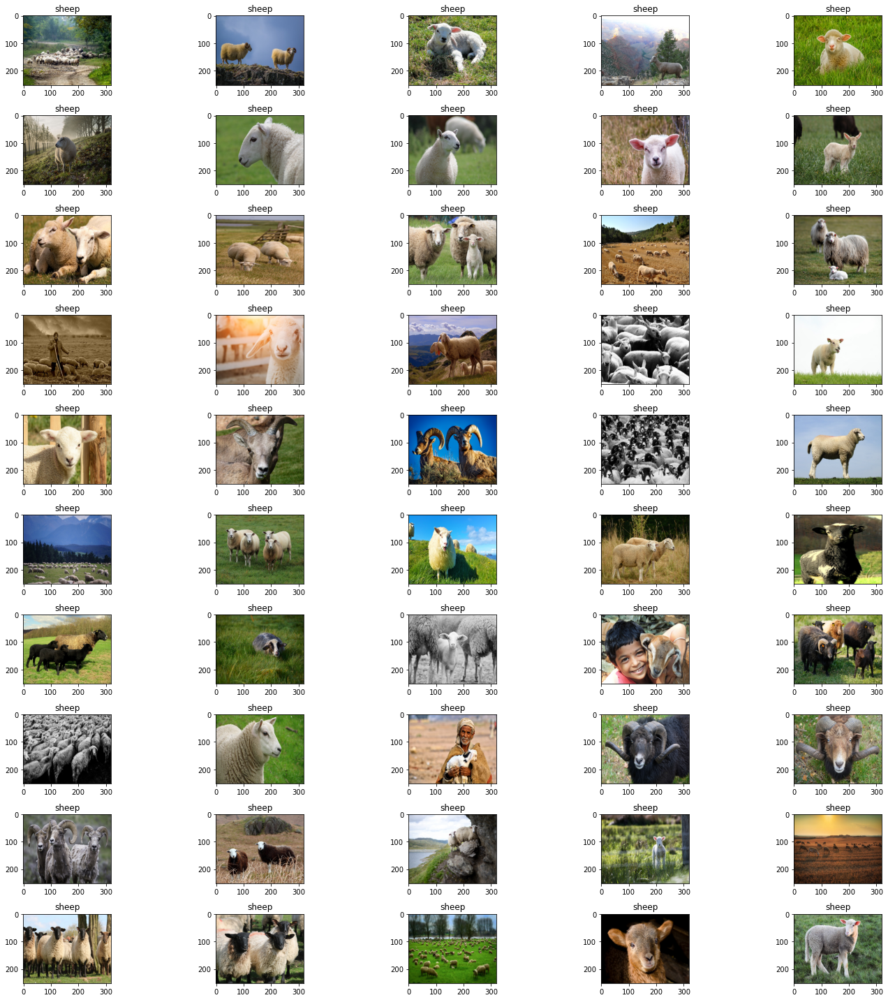

In [21]:
rows,cols = 10,5
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20,20))
for i in range(50):
    path = train_df[train_df.category == 7].values[i]
    axes[i//cols, i%cols].set_title(path[0].split('/')[-2])
    axes[i//cols, i%cols].imshow(images[train_df[train_df.filename == path[0]].index[0]])
plt.tight_layout()

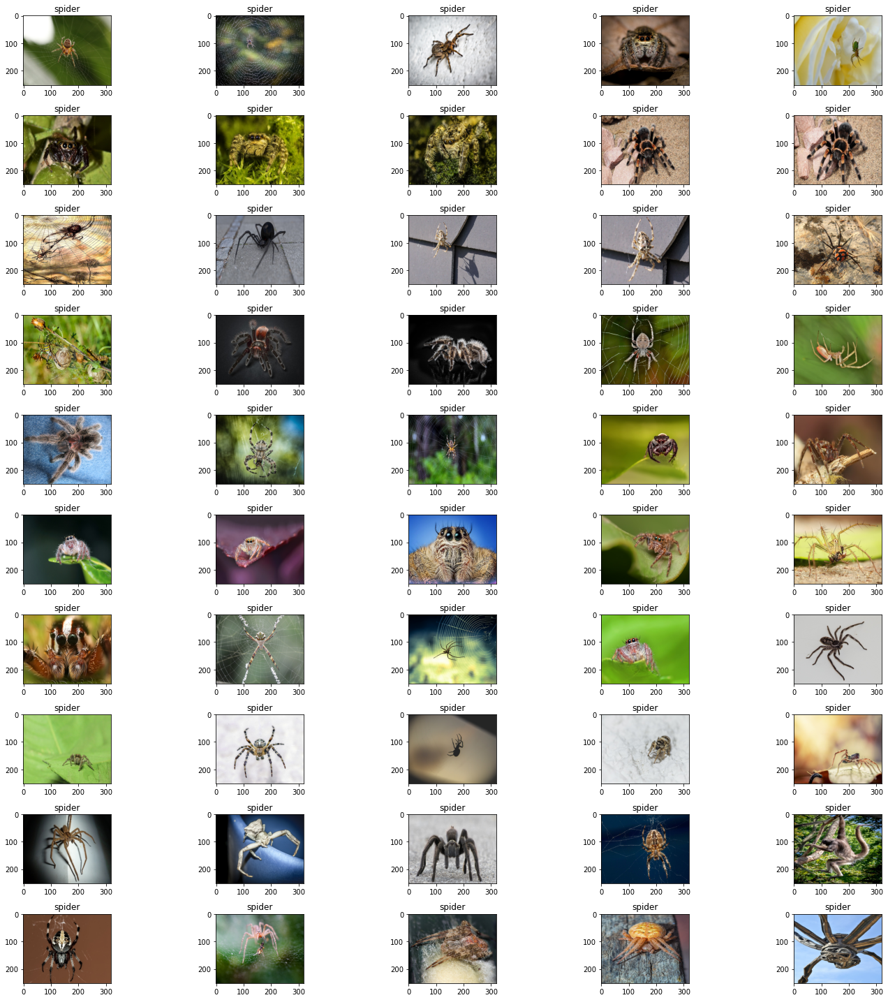

In [22]:
rows,cols = 10,5
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20,20))
for i in range(50):
    path = train_df[train_df.category == 8].values[i]
    axes[i//cols, i%cols].set_title(path[0].split('/')[-2])
    axes[i//cols, i%cols].imshow(images[train_df[train_df.filename == path[0]].index[0]])
plt.tight_layout()

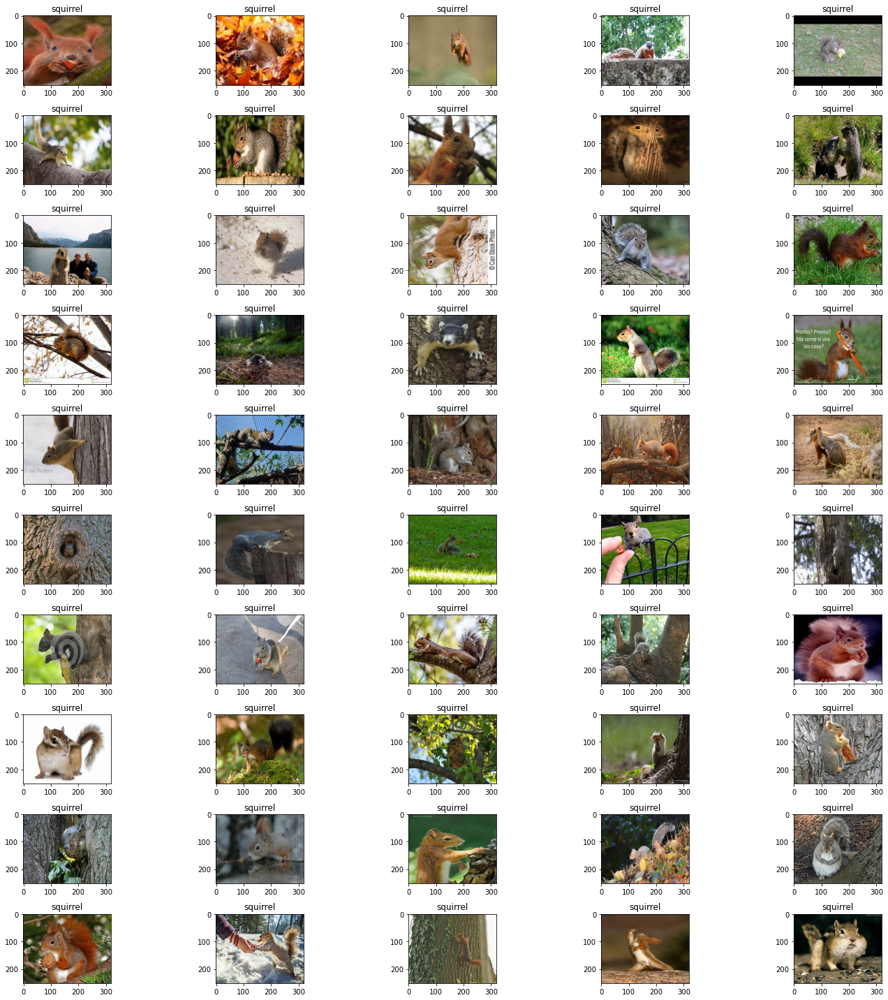

In [23]:
rows,cols = 10,5
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20,20))
for i in range(50):
    path = train_df[train_df.category == 9].values[i]
    axes[i//cols, i%cols].set_title(path[0].split('/')[-2])
    axes[i//cols, i%cols].imshow(images[train_df[train_df.filename == path[0]].index[0]])
plt.tight_layout()